In [2]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np


In [9]:
img = cv2.imread('fruit.png')
img

array([[[ 15,  85,  72],
        [  6,  87,  78],
        [  2, 105, 100],
        ...,
        [ 82, 115, 134],
        [ 48,  82,  88],
        [ 40,  73,  69]],

       [[  8, 107,  89],
        [  4, 110,  97],
        [  2, 129, 120],
        ...,
        [ 67, 110, 125],
        [ 35,  80,  83],
        [ 17,  61,  54]],

       [[  0, 105,  85],
        [  0, 119, 102],
        [  0, 142, 128],
        ...,
        [ 80, 135, 150],
        [ 28,  85,  87],
        [  0,  59,  51]],

       ...,

       [[ 13, 141, 130],
        [ 14, 144, 133],
        [ 21, 152, 141],
        ...,
        [ 59,  61, 131],
        [ 41,  43, 107],
        [ 29,  33,  91]],

       [[  4, 126, 116],
        [ 11, 134, 124],
        [ 17, 147, 136],
        ...,
        [ 30,  34,  83],
        [ 15,  18,  62],
        [ 12,  15,  53]],

       [[ 11, 127, 120],
        [ 13, 134, 126],
        [ 17, 144, 135],
        ...,
        [  7,  11,  46],
        [  8,  14,  43],
        [ 24,  28,  52]]

In [10]:
h, w  = img.shape[:2]

In [13]:
rot_matrix = cv2.getRotationMatrix2D((w/2,h/2), -180, 0.5)
rot_img = cv2.warpAffine(img, rot_matrix,(w,h))


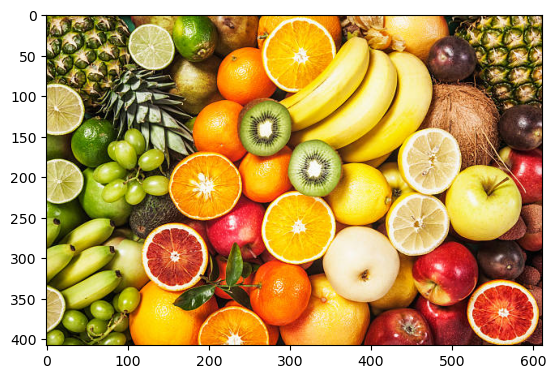

In [17]:
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

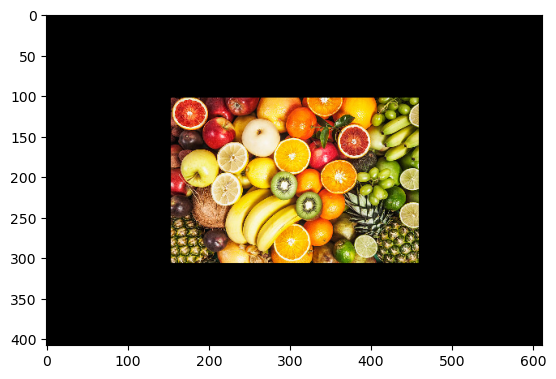

In [18]:
plt.imshow(cv2.cvtColor(rot_img, cv2.COLOR_BGR2RGB))


In [19]:
# to gray
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

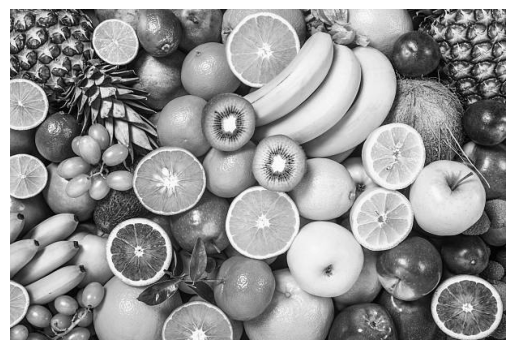

In [31]:
plt.imshow(gray_img , cmap='gray' )
plt.axis('off')
plt.show()

Sobel Edge


In [32]:
x_sobel = cv2.Sobel(img, cv2.CV_64F, 0  ,1, ksize=5)
y_sobel = cv2.Sobel(img, cv2.CV_64F, 1  ,0, ksize=5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11963.0..12074.0].


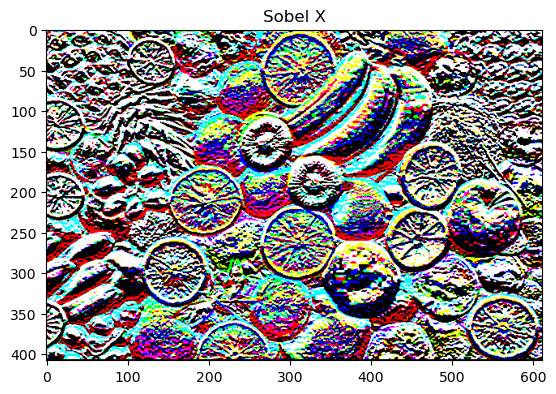

In [35]:
plt.title('Sobel X')
plt.imshow(x_sobel)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12027.0..11801.0].


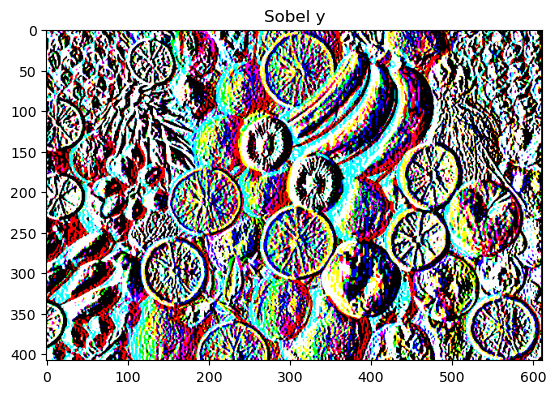

In [36]:
plt.title('Sobel y')
plt.imshow(y_sobel)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-131056.0..131056.0].


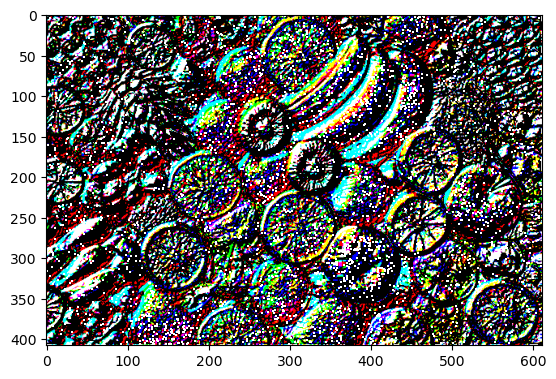

In [37]:
sobel_or = cv2.bitwise_or(x_sobel,y_sobel)
plt.imshow(sobel_or)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-836.0..771.0].


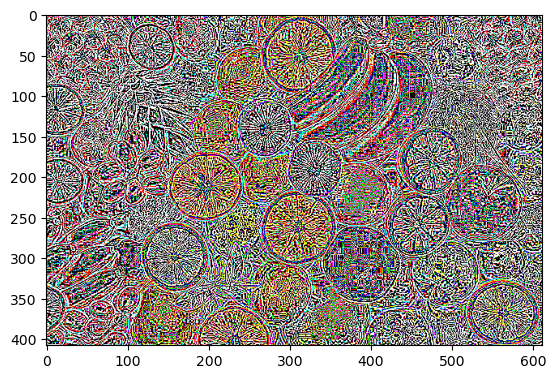

In [38]:
laplacian = cv2.Laplacian(img, cv2.CV_64F)
plt.imshow(laplacian)

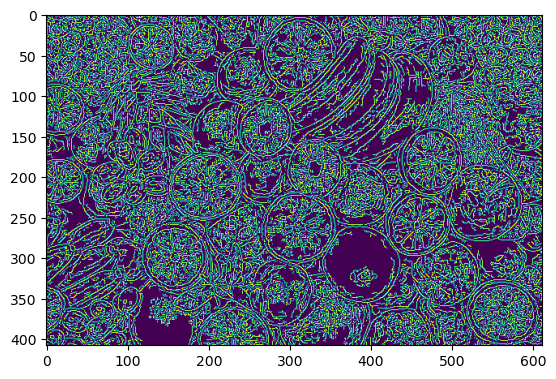

In [39]:
canny = cv2.Canny(img,50,120)
plt.imshow(canny)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11963.0..12074.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12027.0..11801.0].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-131056.0..131056.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-836.0..771.0].


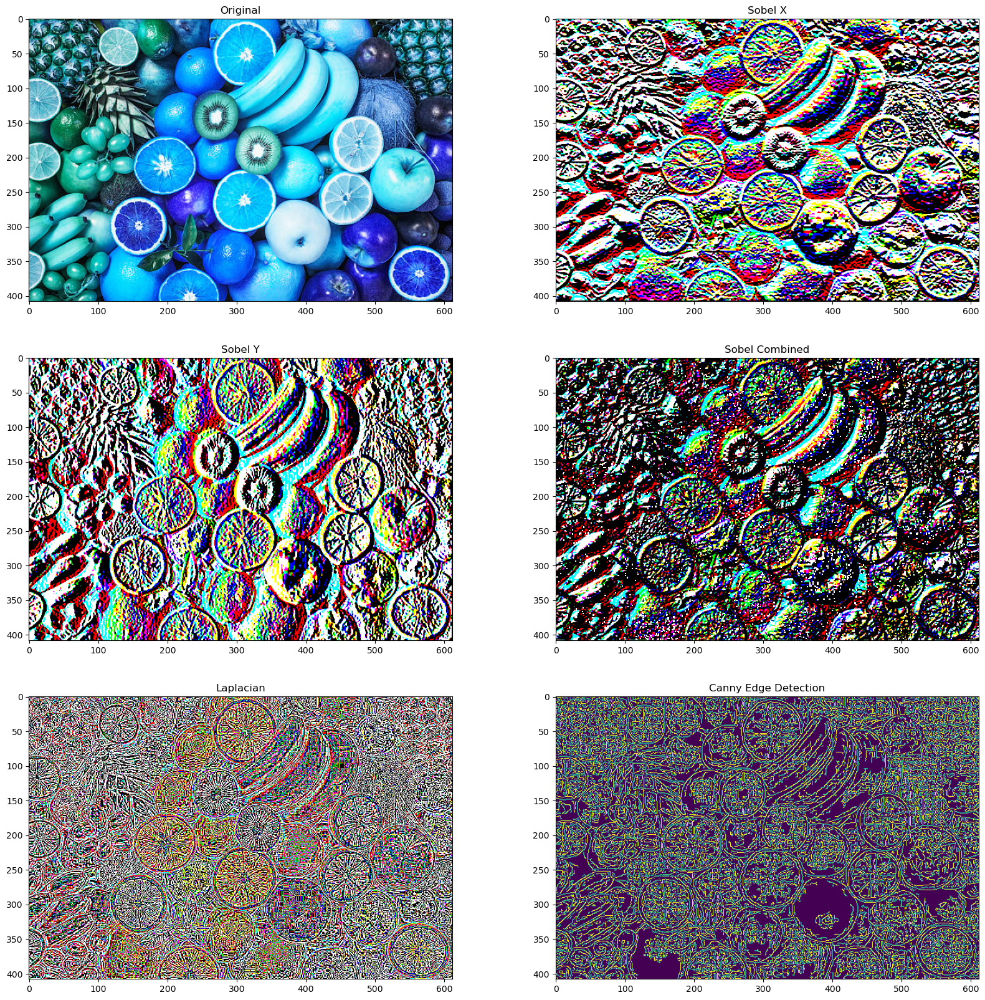

In [41]:
plt.figure(figsize=(20, 20))
plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(img)

plt.subplot(3, 2, 2)
plt.title("Sobel X")
plt.imshow(x_sobel)

plt.subplot(3, 2, 3)
plt.title("Sobel Y")
plt.imshow(y_sobel)

plt.subplot(3, 2, 4)
plt.title("Sobel Combined")
plt.imshow(sobel_or)

plt.subplot(3, 2, 5)
plt.title("Laplacian")
plt.imshow(laplacian)

plt.subplot(3, 2, 6)
plt.title("Canny Edge Detection")
plt.imshow(canny)

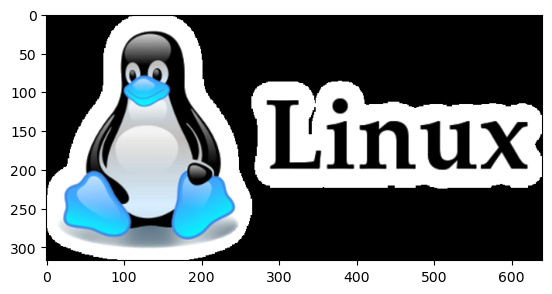

In [43]:
img = cv2.imread('linux.png')
plt.imshow(img)

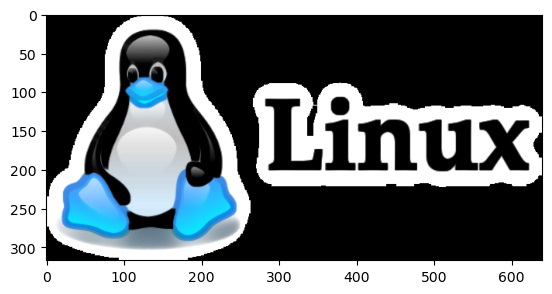

In [48]:

kernal = np.ones((5,5), np.uint8)
erosion = cv2.erode(img, kernal, iterations=1)
# plt.subplot(3,2,2)
# plt.title('Erosion')
plt.imshow(erosion)



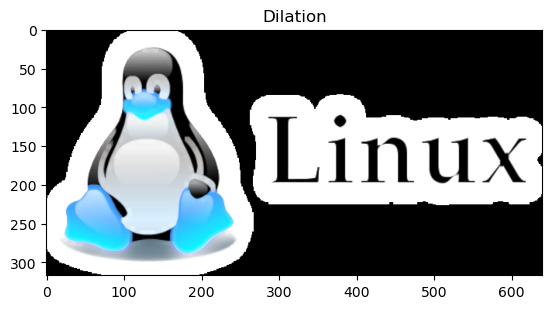

In [50]:
dilation = cv2.dilate(img, kernal ,iterations=1)
# plt.Subplot(3,2,3)
plt.title("Dilation")
plt.imshow(dilation)




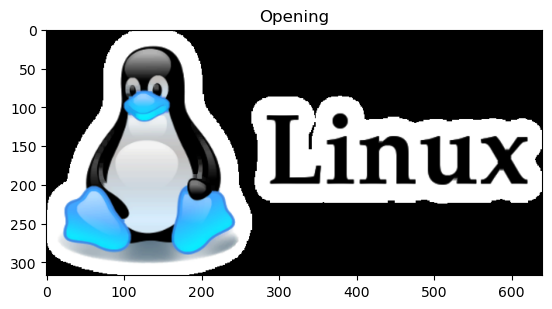

In [51]:

opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernal)
# plt.subplot(3, 2, 4)
plt.title("Opening")
plt.imshow(opening)




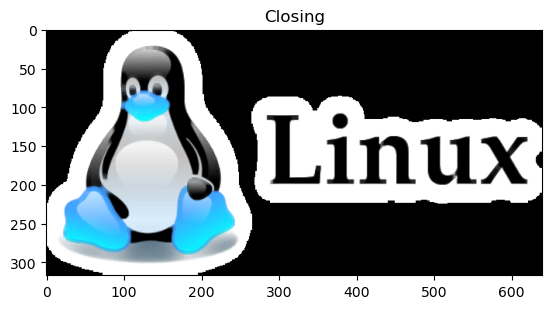

In [52]:
closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernal)
# plt.subplot(3, 2, 5)
plt.title("Closing")
plt.imshow(closing)

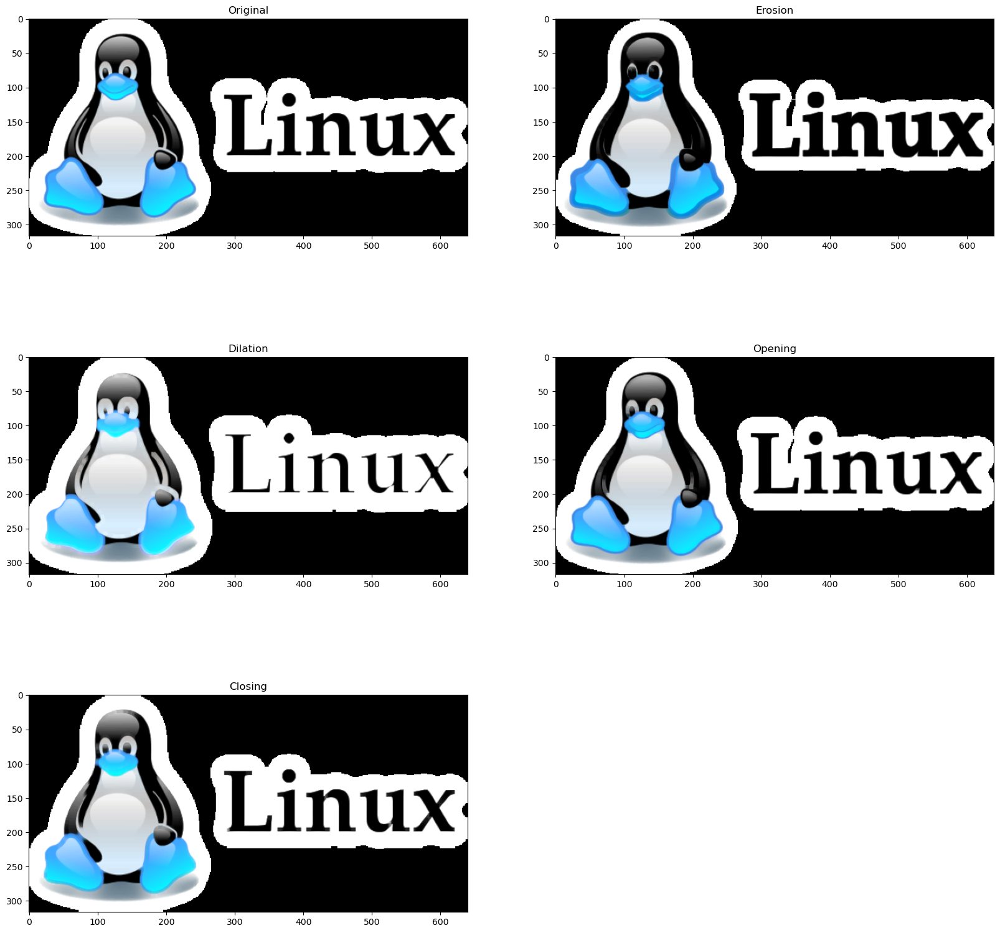

In [53]:
plt.figure(figsize=(20, 20))

plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(img)

plt.subplot(3, 2, 2)
plt.title("Erosion")
plt.imshow(erosion)

plt.subplot(3, 2, 3)
plt.title("Dilation")
plt.imshow(dilation)

plt.subplot(3, 2, 4)
plt.title("Opening")
plt.imshow(opening)

plt.subplot(3, 2, 5)
plt.title("Closing")
plt.imshow(closing)


Prespective Transformation

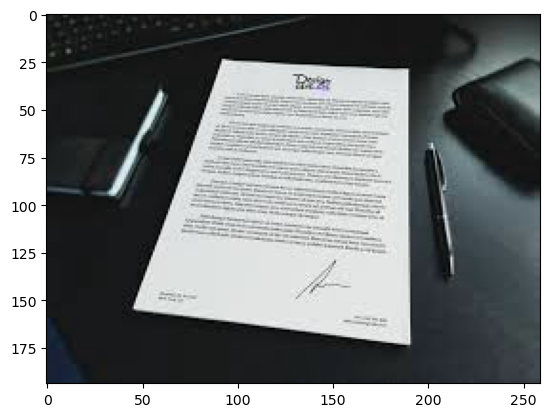

In [54]:
img = cv2.imread('document.png')
plt.imshow(img)

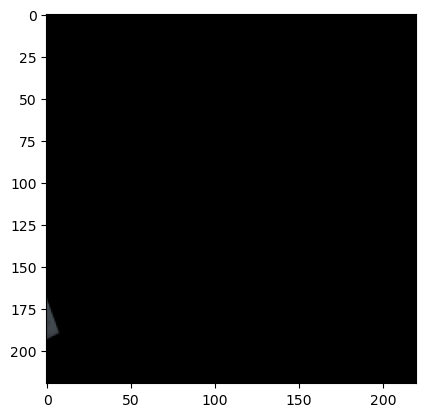

In [59]:
point_A = np.float32([[320,15],[700,215], [85,610], [530,780]] )
points_B = np.float32([[0,0], [420,0], [0,594], [420,594]])
M = cv2.getPerspectiveTransform(point_A, points_B)
warped = cv2.warpPerspective(img, M , (220,220))
plt.imshow(warped)

In [62]:
img = cv2.imread('paper.png')

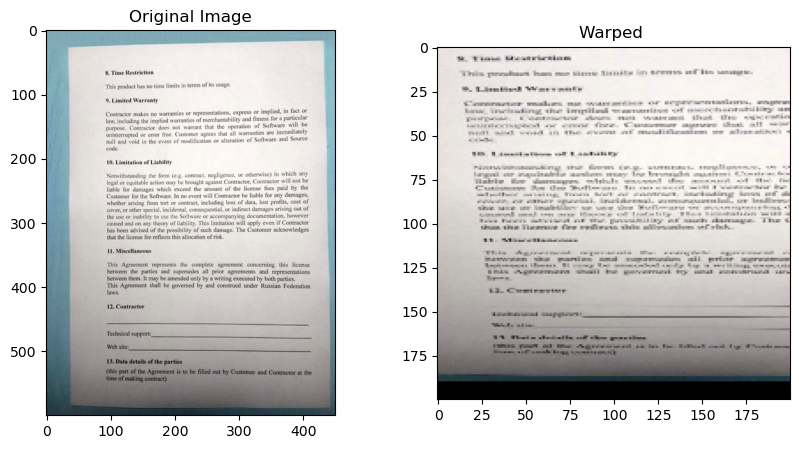

In [67]:


# Define points manually (approximate corners)
point_A = np.float32([[80, 50], [370, 50], [50, 550], [390, 550]])  # Approx corners in original image
points_B = np.float32([[0, 0], [250, 0], [0, 175], [250, 175]])  # Desired top-down dimensions

# Get perspective transformation matrix
M = cv2.getPerspectiveTransform(point_A, points_B)

# Apply warp perspective
warped = cv2.warpPerspective(img, M, (200, 200))

# Display result
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img)

plt.subplot(1, 2, 2)
plt.title("Warped ")
plt.imshow(warped)
plt.show()

Image pyramids

In [4]:
img = cv2.imread('butterfly.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

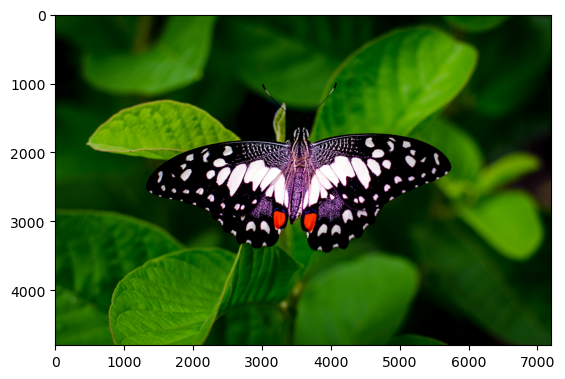

In [5]:
plt.imshow(img)

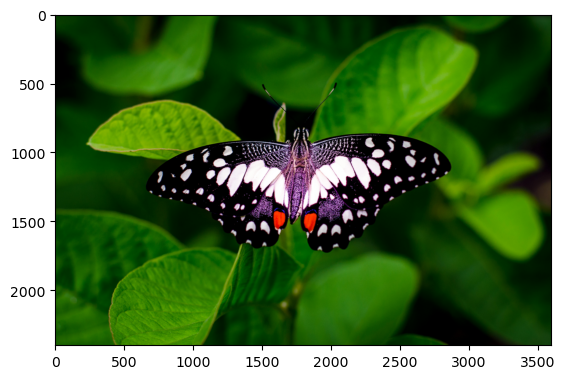

In [7]:
smaller = cv2.pyrDown(img)
plt.imshow(smaller)

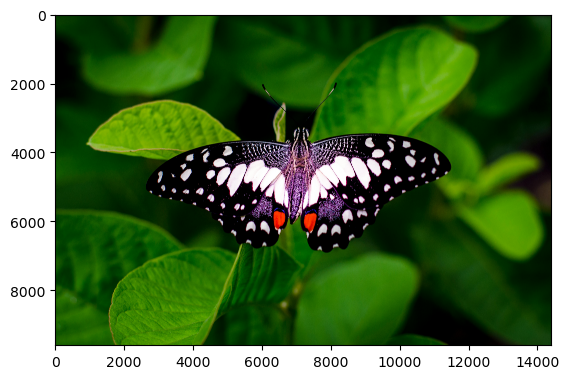

In [10]:
larger = cv2.pyrUp(img)
plt.imshow(larger)

Cropping

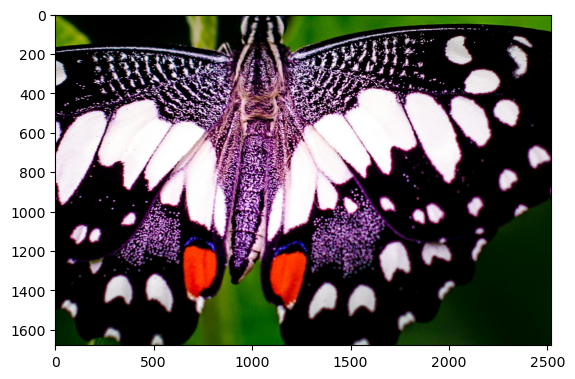

In [12]:
h,w = img.shape[:2]
start_row,start_col = int(h* .35), int(w *.35)
end_row, end_col = int(h* .70), int(w * .70)
croped = img[start_row:end_row , start_col:end_col]
plt.imshow(croped)

Scalling ,interpolation , and Resizing 

In [19]:
img  = cv2.imread('fruit.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

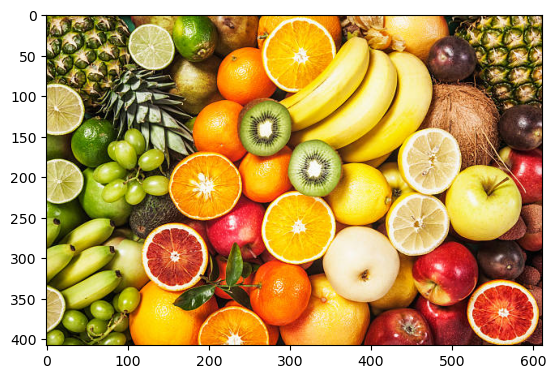

In [20]:
plt.imshow(img)

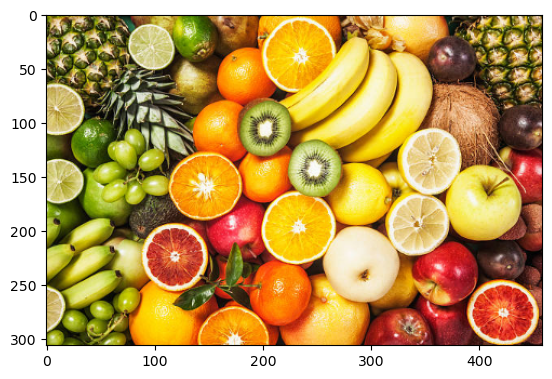

In [ ]:
img_scaled = cv2.resize(img,None, fx=0.75, fy=0.75)
plt.imshow(img_scaled)


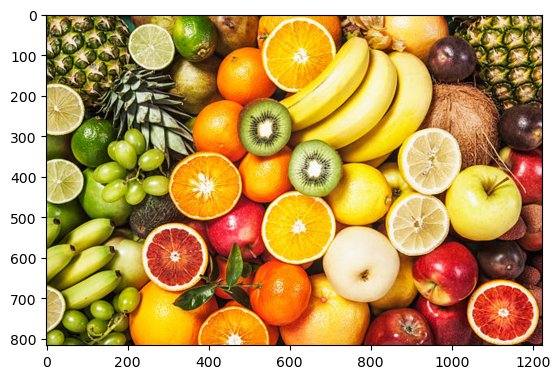

In [30]:
img_scaled = cv2.resize(img, None, fx=2, fy=2, interpolation = cv2.INTER_CUBIC)
plt.imshow(img_scaled)

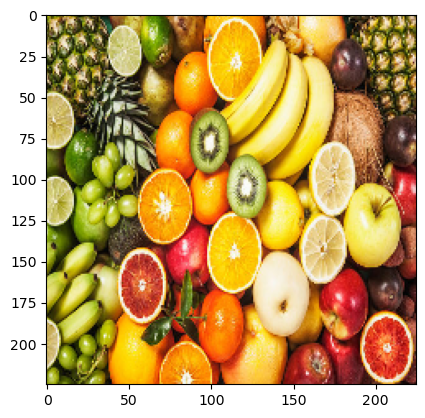

In [36]:
img_scaled = cv2.resize(img, (225, 225))
plt.imshow(img_scaled)

Thresholding ,Adaptive Thresholding ,and Binarization

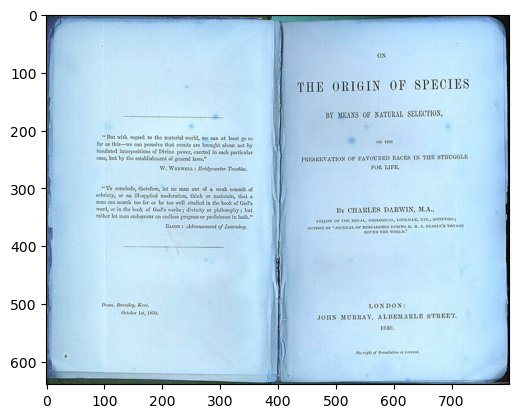

In [37]:
img = cv2.imread('origion_of_spices.png')
plt.imshow(img)

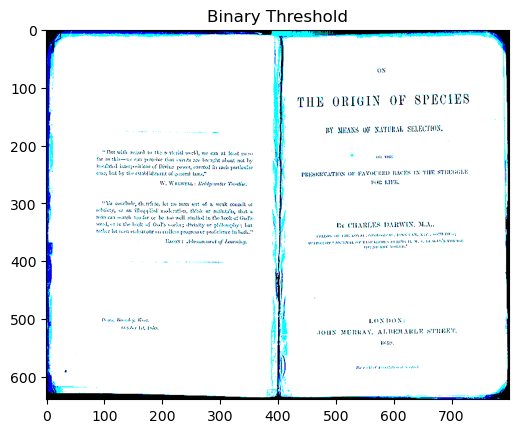

In [39]:
ret,thresh1 = cv2.threshold(img, 127,255, cv2.THRESH_BINARY)
plt.title('Binary Threshold')
plt.imshow(thresh1)

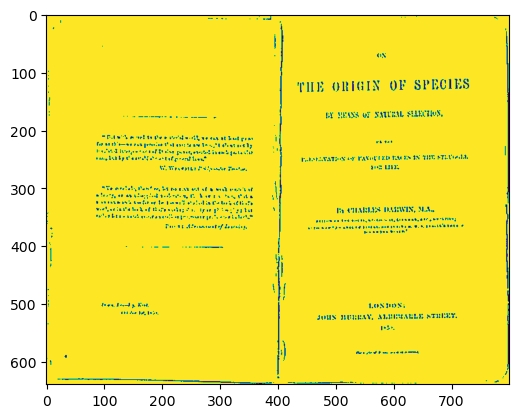

In [47]:
import cv2
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (3, 3), 0)
thresh = cv2.adaptiveThreshold(blurred, 225, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 3, 5)
plt.imshow(thresh)

In [50]:
blur = cv2.GaussianBlur(gray, (5,5), 0)
__, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

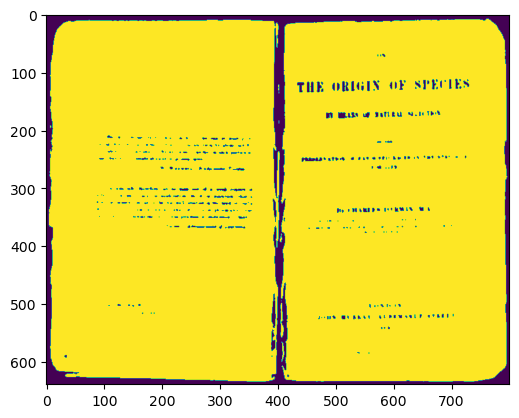

In [51]:
plt.imshow(th3)

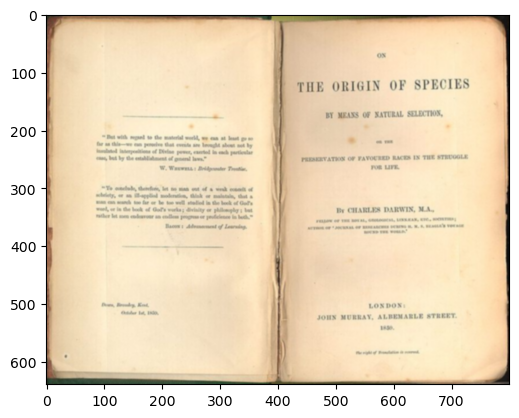

In [52]:
image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(image)

In [53]:
kernel_sharpening = np.array([[-1,-1,-1], 
                              [-1,9,-1], 
                              [-1,-1,-1]])
sharpened = cv2.filter2D(image, -1, kernel_sharpening)

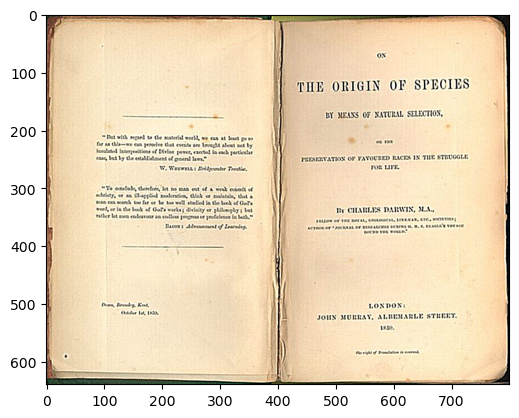

In [54]:
plt.imshow(sharpened)

Bluring

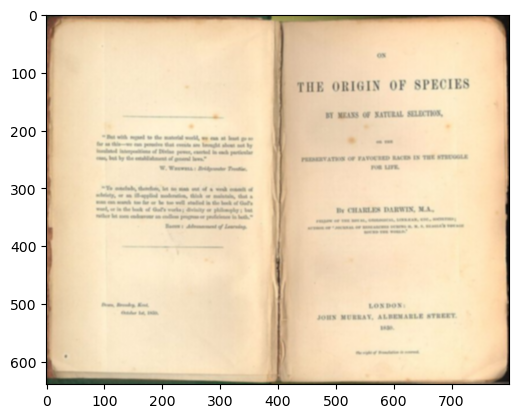

In [56]:
kernel_3x3 = np.ones((3, 3), np.float32) / 9
blurred = cv2.filter2D(image, -1, kernel_3x3)
plt.imshow(blurred)

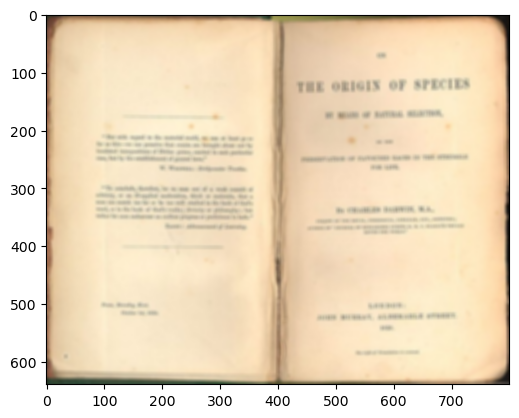

In [57]:
kernel_7x7 = np.ones((7, 7), np.float32) / 49
blurred2 = cv2.filter2D(image, -1, kernel_7x7)
plt.imshow(blurred2)

In [58]:
# Grayscale 
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [59]:
# Canny Edges
edges = cv2.Canny(gray, 100, 170, apertureSize = 3)

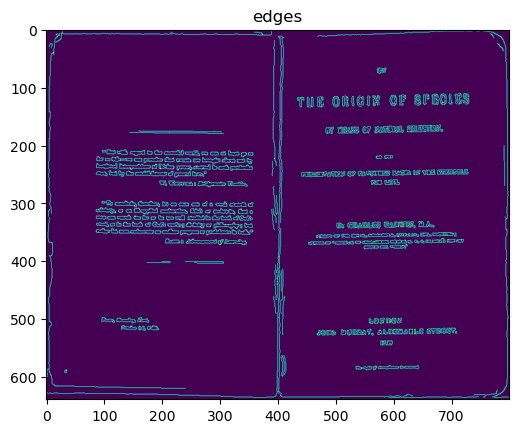

In [60]:
plt.title("edges")
plt.imshow(edges)

In [61]:
# Run HoughLines Fucntion 
lines = cv2.HoughLines(edges, 1, np.pi/180, 200)
# Run for loop through each line
for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x_1 = int(x0 + 1000 * (-b))
    y_1 = int(y0 + 1000 * (a))
    x_2 = int(x0 - 1000 * (-b))
    y_2 = int(y0 - 1000 * (a))
    cv2.line(image, (x_1, y_1), (x_2, y_2), (255, 0, 0), 2)

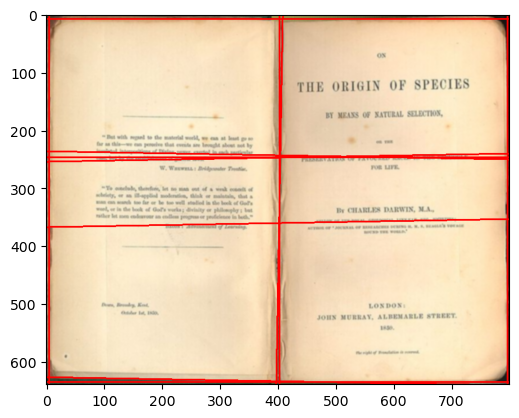

In [62]:
plt.imshow(image)

C:\Program Files\KMSpico\temp\ipykernel_11448\3432699701.py:7: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 256 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  image[h_corners > 0.024 * h_corners.max() ] = [256, 128, 128]


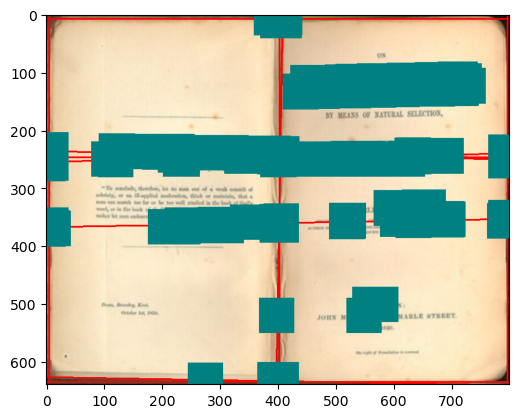

In [64]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# CornerHarris function  want input to be float
gray = np.float32(gray)
h_corners = cv2.cornerHarris(gray, 3, 3, 0.05)
kernel = np.ones((7,7),np.uint8)
h_corners = cv2.dilate(h_corners, kernel, iterations = 10)
image[h_corners > 0.024 * h_corners.max() ] = [256, 128, 128]
plt.subplot(1, 1, 1)
# Final Output
plt.imshow(image)

In [65]:
image = cv2.imread('blobs.png')

In [66]:
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [67]:
detector = cv2.SimpleBlobDetector_create()

In [68]:
points = detector.detect(image)

In [69]:
blank = np.zeros((1,1)) 
blobs = cv2.drawKeypoints(image, points, blank, (0,0,255),
                                      cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

In [71]:
number_of_blobs = len(points)
text = "Total Blobs: " + str(len(points))
cv2.putText(blobs, text, (20, 550), cv2.FONT_HERSHEY_SIMPLEX, 1, (100, 0, 255), 2)


array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

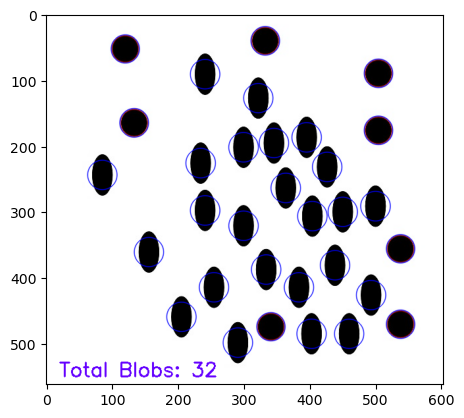

In [72]:
plt.imshow(blobs)

In [73]:
# Detect blobs
keypoints = detector.detect(image)

In [74]:
# Draw blobs on our image as red circles
blank = np.zeros((1,1)) 
blobs = cv2.drawKeypoints(image, keypoints, blank, (0,255,0),
                                      cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
number_of_blobs = len(keypoints)
text = "No.  Circular Blobs: " + str(len(keypoints))
cv2.putText(blobs, text, (20, 550), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 100, 255), 2)

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

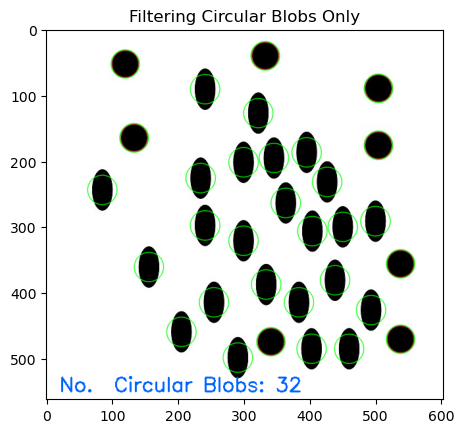

In [75]:
plt.title("Filtering Circular Blobs Only")
plt.imshow(blobs)